## Dataset Information

The training archive contains 25,000 images of dogs and cats. Train your algorithm on these files and predict the labels

(1 = dog, 0 = cat).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Download Dataset


In [1]:
# Download the dataset using Python's urllib
import urllib.request
import os

url = "https://download.microsoft.com/download/3/e/1/3e1c3f21-ecdb-4869-8368-6deba77b919f/kagglecatsanddogs_5340.zip"
filename = "kagglecatsanddogs_5340.zip"

if not os.path.exists(filename):
    print(f"Downloading {filename}...")
    urllib.request.urlretrieve(url, filename)
    print("Download complete!")
else:
    print(f"{filename} already exists.")

Download complete!


## Unzip the Dataset


In [2]:
# Unzip the dataset using Python's zipfile
import zipfile
import os

zip_filename = "kagglecatsanddogs_5340.zip"

if os.path.exists(zip_filename):
    print(f"Extracting {zip_filename}...")
    with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
        zip_ref.extractall('.')
    print("Extraction complete!")
else:
    print(f"{zip_filename} not found. Please download it first.")

Extracting kagglecatsanddogs_5340.zip...
Extraction complete!


## Import Modules


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for Input and Output


In [4]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Cat/3156.jpg 0


In [5]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Cat/9355.jpg,0
1,PetImages/Dog/4244.jpg,1
2,PetImages/Cat/5755.jpg,0
3,PetImages/Cat/4778.jpg,0
4,PetImages/Cat/6729.jpg,0


In [6]:
# Delete corrupted/invalid files
import PIL
from PIL import Image

# Filter out non-jpg files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']

# Check for corrupted images and remove them
print("Checking for corrupted images...")
corrupted_images = []
for idx, image_path in enumerate(df['images']):
    try:
        # Try to open and verify the image
        img = Image.open(image_path)
        img.verify()  # Verify that it is an actual image
        img = Image.open(image_path)  # Reopen after verify
        img.load()  # Try to load the image data
    except Exception as e:
        corrupted_images.append(image_path)
        print(f"Corrupted: {image_path}")

# Remove corrupted images from dataframe
print(f"\nTotal corrupted images found: {len(corrupted_images)}")
df = df[~df['images'].isin(corrupted_images)]
df = df.reset_index(drop=True)

print(f"Remaining valid images: {len(df)}")
print(f"Class distribution:\n{df['label'].value_counts()}")

Checking for corrupted images...
Corrupted: PetImages/Dog/11702.jpg
Corrupted: PetImages/Cat/666.jpg

Total corrupted images found: 2
Remaining valid images: 24998
Class distribution:
label
0    12499
1    12499
Name: count, dtype: int64


## Exploratory Data Analysis


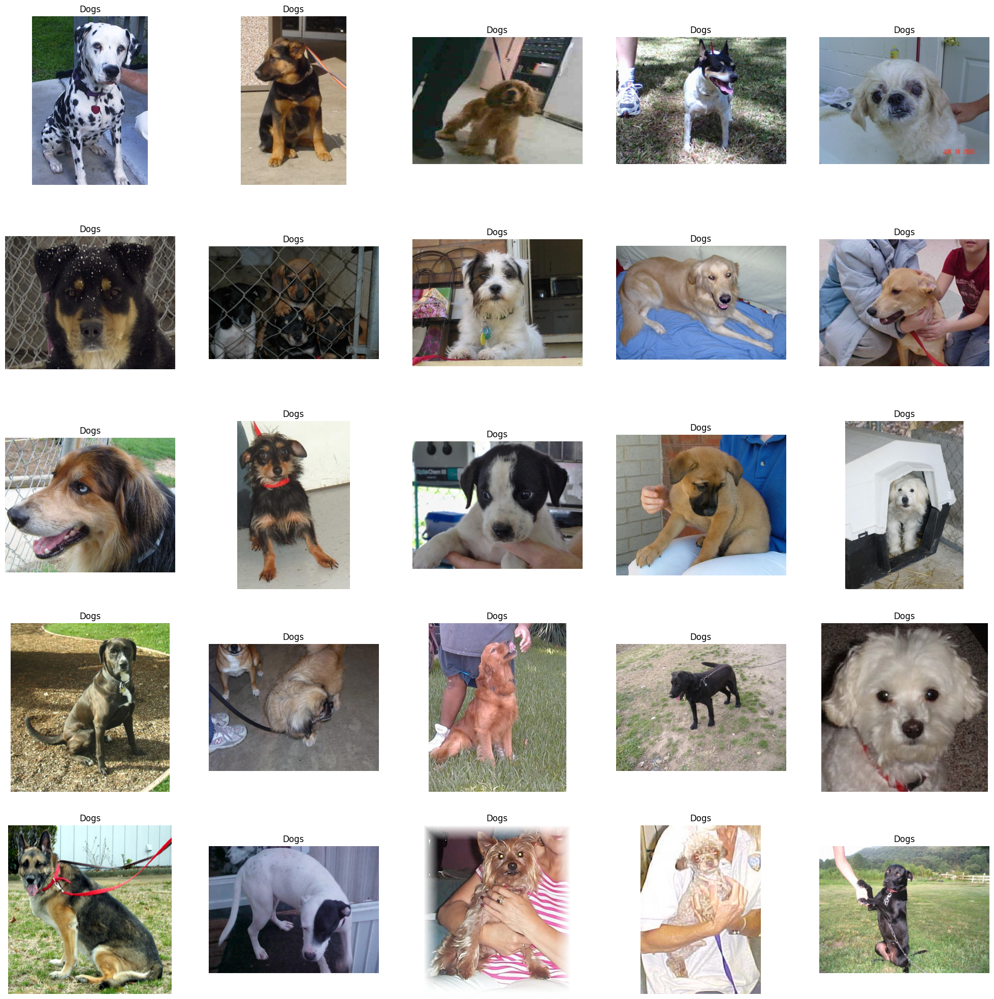

In [7]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

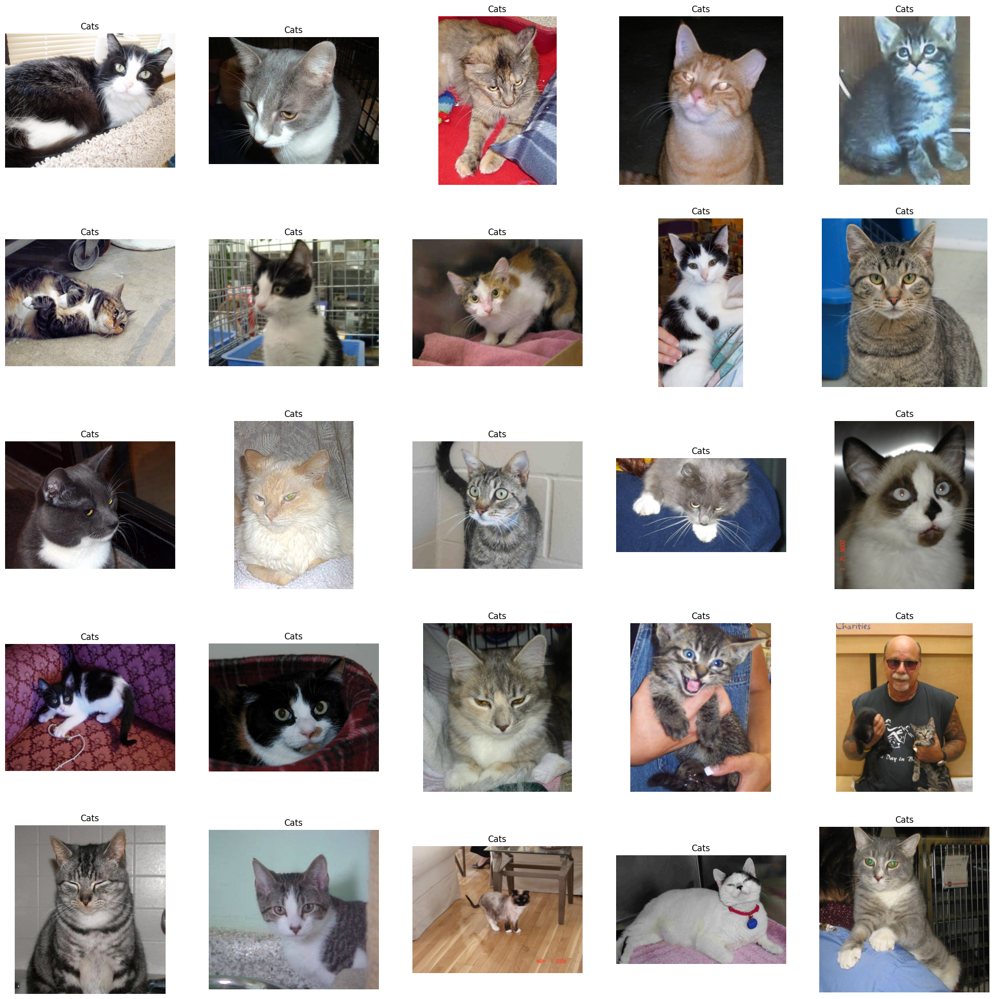

In [8]:
# to display grid of images
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['images']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

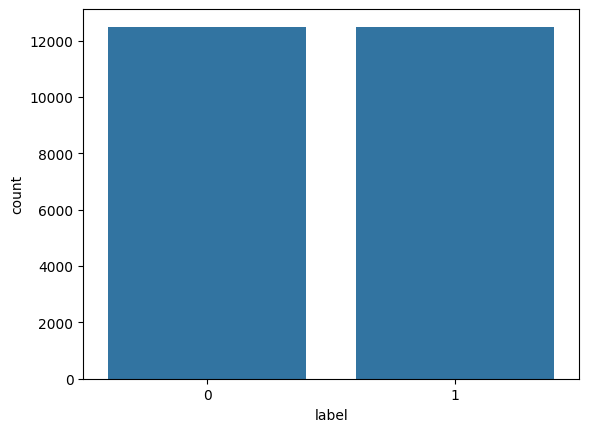

In [9]:
import seaborn as sns
sns.countplot(x=df['label'])

## Create DataGenerator for the Images


In [10]:
df['label'] = df['label'].astype('str')

In [11]:
df.head()

,images,label
0,PetImages/Cat/9355.jpg,0
1,PetImages/Dog/4244.jpg,1
2,PetImages/Cat/5755.jpg,0
3,PetImages/Cat/4778.jpg,0
4,PetImages/Cat/6729.jpg,0


In [12]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [13]:
# from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmentation of images to avoid overfitting
    width_shift_range = 0.2,
    height_shift_range = 0.2,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

# Reduced batch size for better training
train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=32,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=32,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation


In [14]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization

# Improved Model Architecture with Regularization
model = Sequential([
    # First Convolutional Block
    Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3), padding='same'),
    BatchNormalization(),
    Conv2D(32, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPool2D((2,2)),
    Dropout(0.25),

    # Second Convolutional Block
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPool2D((2,2)),
    Dropout(0.25),

    # Third Convolutional Block
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPool2D((2,2)),
    Dropout(0.25),

    # Fourth Convolutional Block
    Conv2D(256, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(256, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPool2D((2,2)),
    Dropout(0.25),

    # Fully Connected Layers
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

print("Model created with improved architecture for production use")

Model created with improved architecture for production use


In [15]:
from tensorflow.keras.optimizers import Adam

# Using Adam optimizer with learning rate scheduling
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 9,699,873 (37.00 MB)

 Trainable params: 9,696,417 (36.99 MB)

 Non-trainable params: 3,456 (13.50 KB)

In [16]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Early Stopping to prevent overfitting
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
    verbose=1
)

# Save the best model
model_checkpoint = ModelCheckpoint(
    'best_model.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

callbacks = [early_stopping, reduce_lr, model_checkpoint]
print("Callbacks configured successfully")

Callbacks configured successfully


## Setup Callbacks for Better Training


In [17]:
# Train with increased epochs and callbacks
history = model.fit(
    train_iterator,
    epochs=50,
    validation_data=val_iterator,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step - accuracy: 0.5644 - loss: 0.8420
Epoch 1: val_accuracy improved from -inf to 0.60600, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 169s 229ms/step - accuracy: 0.5644 - loss: 0.8419 - val_accuracy: 0.6060 - val_loss: 0.7101 - learning_rate: 0.0010
Epoch 2/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.6635 - loss: 0.6163
Epoch 2: val_accuracy improved from 0.60600 to 0.64080, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 127s 203ms/step - accuracy: 0.6635 - loss: 0.6163 - val_accuracy: 0.6408 - val_loss: 0.6254 - learning_rate: 0.0010
Epoch 3/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.6970 - loss: 0.5779
Epoch 3: val_accuracy improved from 0.64080 to 0.73940, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 123s 197ms/step - accuracy: 0.6970 - loss: 0.5779 - val_accuracy: 0.7394 - val_loss: 0.5161 - learning_rate: 0.0010
Epoch 4/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.7356 - loss: 0.5286
Epoch 4: val_accuracy did not improve from 0.73940
625/625 ━━━━━━━━━━━━━━━━━━━━ 123s 197ms/step - accuracy: 0.7356 - loss: 0.5285 - val_accuracy: 0.6586 - val_loss: 0.6806 - learning_rate: 0.0010
Epoch 5/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.7764 - loss: 0.4741
Epoch 5: val_accuracy improved from 0.73940 to 0.82300, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.7764 - loss: 0.4740 - val_accuracy: 0.8230 - val_loss: 0.4113 - learning_rate: 0.0010
Epoch 6/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.8136 - loss: 0.4113
Epoch 6: val_accuracy improved from 0.82300 to 0.83940, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.8136 - loss: 0.4112 - val_accuracy: 0.8394 - val_loss: 0.3831 - learning_rate: 0.0010
Epoch 7/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.8388 - loss: 0.3575
Epoch 7: val_accuracy improved from 0.83940 to 0.87800, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 122s 194ms/step - accuracy: 0.8388 - loss: 0.3575 - val_accuracy: 0.8780 - val_loss: 0.2928 - learning_rate: 0.0010
Epoch 8/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.8642 - loss: 0.3169
Epoch 8: val_accuracy did not improve from 0.87800
625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 192ms/step - accuracy: 0.8642 - loss: 0.3169 - val_accuracy: 0.8700 - val_loss: 0.2980 - learning_rate: 0.0010
Epoch 9/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8615 - loss: 0.3231
Epoch 9: val_accuracy improved from 0.87800 to 0.89520, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 193ms/step - accuracy: 0.8615 - loss: 0.3230 - val_accuracy: 0.8952 - val_loss: 0.2443 - learning_rate: 0.0010
Epoch 10/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.8814 - loss: 0.2755
Epoch 10: val_accuracy improved from 0.89520 to 0.90920, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 192ms/step - accuracy: 0.8814 - loss: 0.2755 - val_accuracy: 0.9092 - val_loss: 0.2125 - learning_rate: 0.0010
Epoch 11/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.8871 - loss: 0.2631
Epoch 11: val_accuracy did not improve from 0.90920
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.8871 - loss: 0.2631 - val_accuracy: 0.8860 - val_loss: 0.2772 - learning_rate: 0.0010
Epoch 12/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8888 - loss: 0.2615
Epoch 12: val_accuracy improved from 0.90920 to 0.92400, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 144s 193ms/step - accuracy: 0.8888 - loss: 0.2615 - val_accuracy: 0.9240 - val_loss: 0.1797 - learning_rate: 0.0010
Epoch 13/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.8980 - loss: 0.2414
Epoch 13: val_accuracy improved from 0.92400 to 0.92440, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 123s 196ms/step - accuracy: 0.8980 - loss: 0.2414 - val_accuracy: 0.9244 - val_loss: 0.1840 - learning_rate: 0.0010
Epoch 14/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.9004 - loss: 0.2378
Epoch 14: val_accuracy improved from 0.92440 to 0.92860, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 193ms/step - accuracy: 0.9004 - loss: 0.2378 - val_accuracy: 0.9286 - val_loss: 0.1823 - learning_rate: 0.0010
Epoch 15/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.9060 - loss: 0.2228
Epoch 15: val_accuracy improved from 0.92860 to 0.93820, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 123s 196ms/step - accuracy: 0.9060 - loss: 0.2228 - val_accuracy: 0.9382 - val_loss: 0.1603 - learning_rate: 0.0010
Epoch 16/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.9104 - loss: 0.2200
Epoch 16: val_accuracy did not improve from 0.93820
625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 194ms/step - accuracy: 0.9104 - loss: 0.2200 - val_accuracy: 0.9334 - val_loss: 0.1563 - learning_rate: 0.0010
Epoch 17/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.9093 - loss: 0.2138
Epoch 17: val_accuracy did not improve from 0.93820
625/625 ━━━━━━━━━━━━━━━━━━━━ 122s 196ms/step - accuracy: 0.9093 - loss: 0.2138 - val_accuracy: 0.9016 - val_loss: 0.2310 - learning_rate: 0.0010
Epoch 18/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9201 - loss: 0.1892
Epoch 18: val_accuracy did not improve from 0.93820
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9201 - loss: 0.1892 - val_accuracy: 0.9366 - val_loss: 0.1522 - learning_rate: 0.00

625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 192ms/step - accuracy: 0.9196 - loss: 0.1960 - val_accuracy: 0.9516 - val_loss: 0.1273 - learning_rate: 0.0010
Epoch 20/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.9219 - loss: 0.1928
Epoch 20: val_accuracy did not improve from 0.95160
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9219 - loss: 0.1928 - val_accuracy: 0.9350 - val_loss: 0.1587 - learning_rate: 0.0010
Epoch 21/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.9239 - loss: 0.1874
Epoch 21: val_accuracy did not improve from 0.95160
625/625 ━━━━━━━━━━━━━━━━━━━━ 118s 189ms/step - accuracy: 0.9239 - loss: 0.1874 - val_accuracy: 0.9480 - val_loss: 0.1244 - learning_rate: 0.0010
Epoch 22/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.9248 - loss: 0.1767
Epoch 22: val_accuracy did not improve from 0.95160
625/625 ━━━━━━━━━━━━━━━━━━━━ 142s 189ms/step - accuracy: 0.9248 - loss: 0.1767 - val_accuracy: 0.9508 - val_loss: 0.1292 - learning_rate: 0.00

625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 192ms/step - accuracy: 0.9304 - loss: 0.1737 - val_accuracy: 0.9530 - val_loss: 0.1257 - learning_rate: 0.0010
Epoch 25/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.9407 - loss: 0.1546
Epoch 25: val_accuracy did not improve from 0.95300
625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.9407 - loss: 0.1546 - val_accuracy: 0.9530 - val_loss: 0.1180 - learning_rate: 5.0000e-04
Epoch 26/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.9450 - loss: 0.1468
Epoch 26: val_accuracy improved from 0.95300 to 0.96080, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.9449 - loss: 0.1468 - val_accuracy: 0.9608 - val_loss: 0.0979 - learning_rate: 5.0000e-04
Epoch 27/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9444 - loss: 0.1405
Epoch 27: val_accuracy improved from 0.96080 to 0.96320, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 192ms/step - accuracy: 0.9444 - loss: 0.1405 - val_accuracy: 0.9632 - val_loss: 0.0943 - learning_rate: 5.0000e-04
Epoch 28/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9452 - loss: 0.1367
Epoch 28: val_accuracy did not improve from 0.96320
625/625 ━━━━━━━━━━━━━━━━━━━━ 141s 190ms/step - accuracy: 0.9452 - loss: 0.1367 - val_accuracy: 0.9586 - val_loss: 0.1063 - learning_rate: 5.0000e-04
Epoch 29/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.9464 - loss: 0.1355
Epoch 29: val_accuracy did not improve from 0.96320
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 190ms/step - accuracy: 0.9464 - loss: 0.1355 - val_accuracy: 0.9572 - val_loss: 0.1090 - learning_rate: 5.0000e-04
Epoch 30/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.9458 - loss: 0.1362
Epoch 30: val_accuracy improved from 0.96320 to 0.96500, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.9458 - loss: 0.1362 - val_accuracy: 0.9650 - val_loss: 0.0851 - learning_rate: 5.0000e-04
Epoch 31/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9506 - loss: 0.1277
Epoch 31: val_accuracy improved from 0.96500 to 0.96780, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 191ms/step - accuracy: 0.9506 - loss: 0.1277 - val_accuracy: 0.9678 - val_loss: 0.0850 - learning_rate: 5.0000e-04
Epoch 32/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.9508 - loss: 0.1274
Epoch 32: val_accuracy did not improve from 0.96780
625/625 ━━━━━━━━━━━━━━━━━━━━ 118s 189ms/step - accuracy: 0.9508 - loss: 0.1274 - val_accuracy: 0.9550 - val_loss: 0.1098 - learning_rate: 5.0000e-04
Epoch 33/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9495 - loss: 0.1235
Epoch 33: val_accuracy did not improve from 0.96780
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9495 - loss: 0.1235 - val_accuracy: 0.9668 - val_loss: 0.0870 - learning_rate: 5.0000e-04
Epoch 34/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step - accuracy: 0.9527 - loss: 0.1201
Epoch 34: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.

Epoch 34: val_accuracy did not improve from 0.96780
625/625 ━━━━━━━━━━━━━━━━━━━━ 123s 196ms/step - accur

625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.9565 - loss: 0.1155 - val_accuracy: 0.9728 - val_loss: 0.0725 - learning_rate: 2.5000e-04
Epoch 36/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.9543 - loss: 0.1151
Epoch 36: val_accuracy did not improve from 0.97280
625/625 ━━━━━━━━━━━━━━━━━━━━ 122s 196ms/step - accuracy: 0.9543 - loss: 0.1151 - val_accuracy: 0.9692 - val_loss: 0.0814 - learning_rate: 2.5000e-04
Epoch 37/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.9600 - loss: 0.1052
Epoch 37: val_accuracy did not improve from 0.97280
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 190ms/step - accuracy: 0.9600 - loss: 0.1052 - val_accuracy: 0.9704 - val_loss: 0.0773 - learning_rate: 2.5000e-04
Epoch 38/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9583 - loss: 0.1099
Epoch 38: ReduceLROnPlateau reducing learning rate to 0.0001250000059371814.

Epoch 38: val_accuracy did not improve from 0.97280
625/625 ━━━━━━━━━━━━━━━━━━━━ 120s 191ms/step - accur

625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9613 - loss: 0.1005 - val_accuracy: 0.9732 - val_loss: 0.0722 - learning_rate: 1.2500e-04
Epoch 41/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9625 - loss: 0.0996
Epoch 41: val_accuracy did not improve from 0.97320
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9625 - loss: 0.0996 - val_accuracy: 0.9672 - val_loss: 0.0802 - learning_rate: 1.2500e-04
Epoch 42/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step - accuracy: 0.9650 - loss: 0.0964
Epoch 42: val_accuracy did not improve from 0.97320
625/625 ━━━━━━━━━━━━━━━━━━━━ 118s 189ms/step - accuracy: 0.9650 - loss: 0.0964 - val_accuracy: 0.9692 - val_loss: 0.0723 - learning_rate: 1.2500e-04
Epoch 43/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step - accuracy: 0.9612 - loss: 0.0994
Epoch 43: val_accuracy improved from 0.97320 to 0.97420, saving model to best_model.h5


625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accuracy: 0.9612 - loss: 0.0994 - val_accuracy: 0.9742 - val_loss: 0.0679 - learning_rate: 1.2500e-04
Epoch 44/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - accuracy: 0.9622 - loss: 0.1006
Epoch 44: val_accuracy did not improve from 0.97420
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 191ms/step - accuracy: 0.9622 - loss: 0.1006 - val_accuracy: 0.9684 - val_loss: 0.0781 - learning_rate: 1.2500e-04
Epoch 45/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - accuracy: 0.9659 - loss: 0.0910
Epoch 45: val_accuracy did not improve from 0.97420
625/625 ━━━━━━━━━━━━━━━━━━━━ 119s 190ms/step - accuracy: 0.9659 - loss: 0.0910 - val_accuracy: 0.9708 - val_loss: 0.0718 - learning_rate: 1.2500e-04
Epoch 46/50
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - accuracy: 0.9653 - loss: 0.0914
Epoch 46: ReduceLROnPlateau reducing learning rate to 6.25000029685907e-05.

Epoch 46: val_accuracy did not improve from 0.97420
625/625 ━━━━━━━━━━━━━━━━━━━━ 121s 193ms/step - accura

## Visualization of Results


In [18]:
# Evaluate on test set
test_loss, test_accuracy = model.evaluate(val_iterator)
print(f"\nTest Accuracy: {test_accuracy*100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.9740 - loss: 0.0682

Test Accuracy: 97.42%
Test Loss: 0.0679


## Model Evaluation


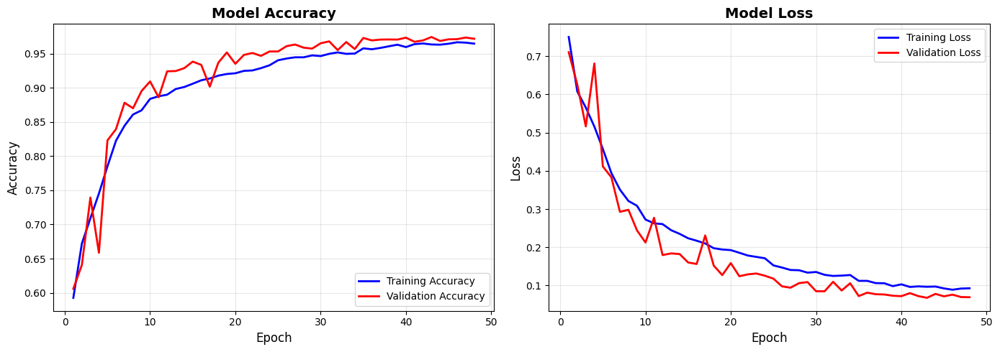


Final Training Accuracy: 96.45%
Final Validation Accuracy: 97.16%
Final Training Loss: 0.0928
Final Validation Loss: 0.0695


In [19]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.figure(figsize=(14, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'b-', label='Training Accuracy', linewidth=2)
plt.plot(epochs, val_acc, 'r-', label='Validation Accuracy', linewidth=2)
plt.title('Model Accuracy', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Loss Plot
plt.subplot(1, 2, 2)
loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b-', label='Training Loss', linewidth=2)
plt.plot(epochs, val_loss, 'r-', label='Validation Loss', linewidth=2)
plt.title('Model Loss', fontsize=14, fontweight='bold')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final metrics
print(f"\nFinal Training Accuracy: {acc[-1]*100:.2f}%")
print(f"Final Validation Accuracy: {val_acc[-1]*100:.2f}%")
print(f"Final Training Loss: {loss[-1]:.4f}")
print(f"Final Validation Loss: {val_loss[-1]:.4f}")

## Test with Real Image


157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step


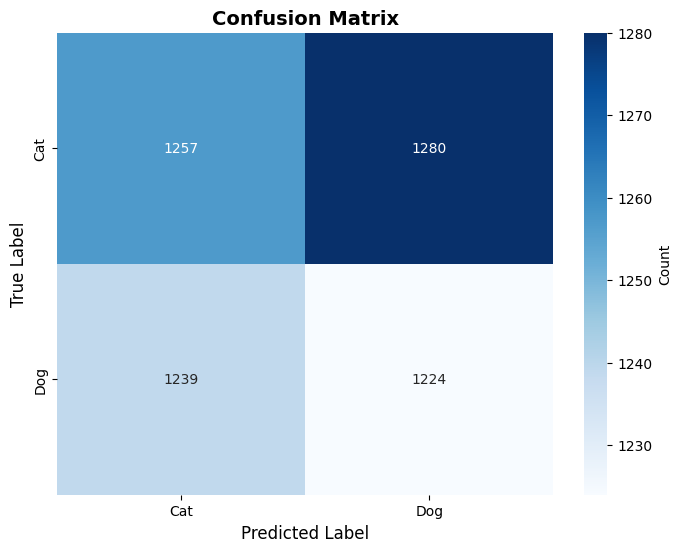


Classification Report:
              precision    recall  f1-score   support

         Cat     0.5036    0.4955    0.4995      2537
         Dog     0.4888    0.4970    0.4929      2463

    accuracy                         0.4962      5000
   macro avg     0.4962    0.4962    0.4962      5000
weighted avg     0.4963    0.4962    0.4962      5000



In [20]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

# Get predictions for test set
val_iterator.reset()
y_pred = model.predict(val_iterator)
y_pred_classes = (y_pred > 0.5).astype(int).flatten()
y_true = val_iterator.classes

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Cat', 'Dog'],
            yticklabels=['Cat', 'Dog'],
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.show()

# Classification Report
print("\nClassification Report:")
print(classification_report(y_true, y_pred_classes,
                          target_names=['Cat', 'Dog'],
                          digits=4))

## Confusion Matrix and Classification Report


In [ ]:
# Use an image from the downloaded dataset for testing
# Select a random dog image from the dataset
import random
dog_images = df[df['label']=='1']['images'].values
image_path = random.choice(dog_images)
print(f"Testing with image: {image_path}")

img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(f"The image is predicted to be a: {label}")

# Display the image
plt.imshow(load_img(image_path))
plt.title(f'Predicted: {label}')
plt.axis('off')
plt.show()

Testing with image: PetImages/Cat/11419.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
The image is predicted to be a: Cat


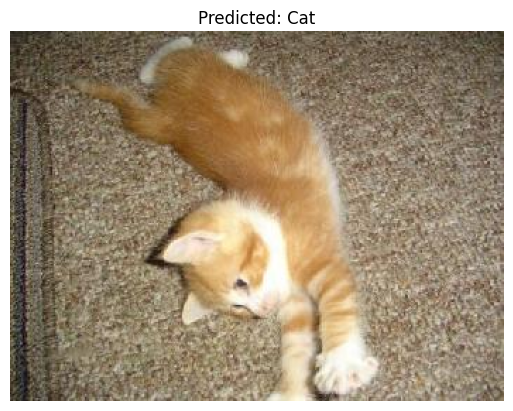

In [22]:
# Use an image from the downloaded dataset for testing
# Select a random cat image from the dataset
cat_images = df[df['label']=='0']['images'].values
image_path = random.choice(cat_images)
print(f"Testing with image: {image_path}")

img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(f"The image is predicted to be a: {label}")

# Display the image
plt.imshow(load_img(image_path))
plt.title(f'Predicted: {label}')
plt.axis('off')
plt.show()

In [24]:
# Save the final model in the native Keras format (recommended)
model.save('dogs_vs_cats_production_model.keras')
print("Model saved as 'dogs_vs_cats_production_model.keras'")

# Save model in SavedModel format (recommended for production)
model.export('dogs_vs_cats_model')
print("Model saved in SavedModel format at 'dogs_vs_cats_model/'")

# Print model summary
print("\n" + "="*60)
print("MODEL READY FOR PRODUCTION")
print("="*60)
print(f"Total Parameters: {model.count_params():,}")
print(f"Input Shape: (128, 128, 3)")
print(f"Output: Binary classification (Cat=0, Dog=1)")
print("="*60)

Model saved as 'dogs_vs_cats_production_model.keras'
Saved artifact at 'dogs_vs_cats_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  132386463560720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463559760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463558416: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463560912: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463561680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463561488: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463561296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463560528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463559184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  132386463562832: TensorSpec(s

## Save Model for Production
